<a href="https://colab.research.google.com/github/JoelmirDias/Trabalho/blob/main/Dessalgadora_Final_Binario_200A_ipyn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Modelo de arraste da dessalgadora da U200A

In [1]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 22.0 MB 1.5 MB/s 
     |████████████████████████████████| 102 kB 6.6 MB/s 
     |████████████████████████████████| 690 kB 31.9 MB/s 
     |████████████████████████████████| 62 kB 1.5 MB/s 
     |████████████████████████████████| 9.8 MB 52.2 MB/s 
     |████████████████████████████████| 4.7 MB 33.9 MB/s 
     |████████████████████████████████| 296 kB 51.7 MB/s 
  Created wheel for pandas-profiling: filename=pandas_profiling-3.4.0-py2.py3-none-any.whl size=315269 sha256=f0cb2bd18c956af5e29d9b8e564e1c92c73180d1ebf56ec664dd22b0dd283c00
  Stored in directory: /tmp/pip-ephem-wheel-cache-mef7gzem/wheels/cc/d5/09/083fb07c9363a2f45854b0e3a7de7d7c560f07da74b9e9769d
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=604fc1f667c567213cfef2e3915277f34d71213f5b123cfdcae80e4ba7c96d42
  Stored in directory: /root/.cache/pip/whee

In [2]:
from __future__ import print_function
%matplotlib inline
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as image
import pandas as pd
from pandas_profiling import ProfileReport
plt.style.use("ggplot")
warnings.simplefilter("ignore")
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
import seaborn as sns

In [3]:
plt.rcParams['figure.figsize'] = (12,8)


### Importação dos dados

In [4]:
url='https://github.com/JoelmirDias/Trabalho/blob/main/Dados_Exporta.xlsx?raw=true'

In [5]:
#dados=pd.read_excel(url, sheet_name='Dados_Exporta')
dados=pd.read_excel(url)

In [6]:
dados.tail()

,SALMOURA,TI20604,TI20605,Carga,Densidade,POLI,DESEM,pH,LIC20506A,LIC20506B,LIC20506C,LIC20506D,PDI20632,PDI20633,PDI20502,PDI20504
8786,CLARA,142.685699,145.477005,33038.753906,0.870441,NÃO INJETA,NÃO INJETA,7.0,38.329708,37.981461,52.909370,54.633991,1.130379,1.099765,1.205482,1.142729
8787,CLARA,136.542603,140.084503,32996.617188,0.870441,NÃO INJETA,NÃO INJETA,7.0,38.017380,38.033390,53.139950,55.334190,1.137245,1.129377,1.217880,1.188458
8788,CLARA,136.537094,140.028595,32954.429688,0.870441,NÃO INJETA,NÃO INJETA,5.2,38.096050,38.116711,53.187061,55.575260,1.181735,1.123417,1.227226,1.190700
8789,CLARA,138.628403,140.281693,32959.792969,0.870441,NÃO INJETA,NÃO INJETA,5.2,38.224800,37.931492,53.447880,54.274139,1.161183,1.151026,1.226320,1.179828
8790,CLARA,144.738998,145.729599,32966.441406,0.870441,NÃO INJETA,NÃO INJETA,5.2,35.144390,32.754398,42.329910,43.762760,1.195325,1.121223,1.150549,1.152695


### Relatório dos dados

In [ ]:
profile=dados.profile_report()
profile.to_file(output_file="dessalgadora.html")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### Hot-Encoding: Criação de variáveis dummies

In [7]:
cat_vars=['POLI','DESEM']
for var in cat_vars:
  cat_list = pd.get_dummies(dados[var], prefix=var)
  dados = dados.join(cat_list)

In [8]:
dados['SALMOURA'].value_counts()

CLARA     8242
TURVA      278
ESCURA     271
Name: SALMOURA, dtype: int64

In [9]:
Arraste=[]
for i in range(len(dados['SALMOURA'])):
  if dados['SALMOURA'][i]=='CLARA':
    Arraste.append(0)
  else:
    Arraste.append(2)
dados['Arraste']=Arraste

In [10]:
dados.drop(columns=['SALMOURA','POLI','DESEM','DESEM_NÃO INJETA','POLI_NÃO INJETA' ], inplace=True)

### Visualização do Desbalanceamento

In [11]:
from yellowbrick.target import ClassBalance
plt.style.use("ggplot")
plt.rcParams['figure.figsize'] = (12,8)

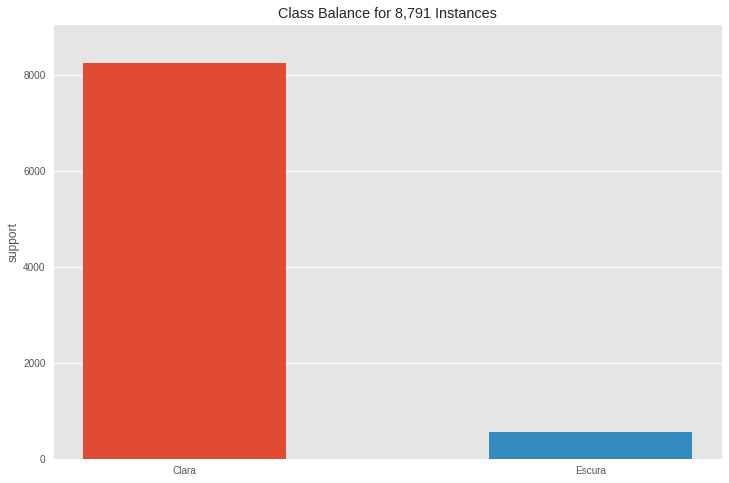

In [12]:
visualizer=ClassBalance(labels=['Clara','Escura']).fit(dados.Arraste)
visualizer.show()

Conclusão: Modelo bastante desbalanceado. Utilizaremos técnica de sobre/sub-amostragem

In [13]:
dados.Arraste.value_counts()

0    8242
2     549
Name: Arraste, dtype: int64

Considera-se que há dados suficiente da categoria 1 e 2 para fazer subamostragem.

### Técnica de Subamostragem

In [14]:
from imblearn.under_sampling import RandomUnderSampler

In [15]:
X = dados.loc[:, dados.columns != 'Arraste']
y = dados.Arraste

In [16]:
sub=RandomUnderSampler()
x_sub,y_sub=sub.fit_resample(X, y)
y_sub.value_counts()

0    549
2    549
Name: Arraste, dtype: int64

In [17]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x_sub, y_sub, test_size=0.3, stratify=y_sub)

### Criação dos Modelos

In [18]:
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score
from sklearn.tree import export_graphviz # display the tree within a Jupyter notebook
from IPython.display import SVG
from graphviz import Source
from IPython.display import display
from ipywidgets import interactive, IntSlider, FloatSlider, interact
import ipywidgets
from IPython.display import Image
from subprocess import call
import matplotlib.image as mpimg
from yellowbrick.model_selection import FeatureImportances
from yellowbrick.classifier import ROCAUC
from yellowbrick.classifier import ClassificationReport

In [19]:
from sklearn.metrics import confusion_matrix as cm
from sklearn.metrics import ConfusionMatrixDisplay
plt.rcParams['figure.figsize']=[16,9]

### Ajuste RandomForest

In [20]:
from sklearn.model_selection import KFold
crossvalidation=KFold(n_splits=5, shuffle=True, random_state=1)
scorer='accuracy'
max_features=[x_sub.shape[1]/3, 'sqrt','log2','auto']
min_samples_leaf=[1,10,30]
n_estimators=[50,100,300]
RF=RandomForestClassifier()

In [30]:
search_grid= {'n_estimators':n_estimators,'max_features': max_features,'min_samples_leaf':min_samples_leaf}
rf_cv=GridSearchCV(estimator=RF,
                         param_grid=search_grid,
                         scoring=scorer,
                         cv=crossvalidation,
                         verbose=3)
rf_cv.fit(X_train,y_train)
best_params_rf=rf_cv.best_params_
best_score_rf=rf_cv.best_score_
print('Melhores parâmetros: %s'% best_params_rf)
print('Melhor acurácia: %s'% best_score_rf)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
[CV 1/5] END max_features=5.0, min_samples_leaf=1, n_estimators=50;, score=nan total time=   0.1s
[CV 2/5] END max_features=5.0, min_samples_leaf=1, n_estimators=50;, score=nan total time=   0.1s
[CV 3/5] END max_features=5.0, min_samples_leaf=1, n_estimators=50;, score=nan total time=   0.0s
[CV 4/5] END max_features=5.0, min_samples_leaf=1, n_estimators=50;, score=nan total time=   0.1s
[CV 5/5] END max_features=5.0, min_samples_leaf=1, n_estimators=50;, score=nan total time=   0.1s
[CV 1/5] END max_features=5.0, min_samples_leaf=1, n_estimators=100;, score=nan total time=   0.2s
[CV 2/5] END max_features=5.0, min_samples_leaf=1, n_estimators=100;, score=nan total time=   0.1s
[CV 3/5] END max_features=5.0, min_samples_leaf=1, n_estimators=100;, score=nan total time=   0.1s
[CV 4/5] END max_features=5.0, min_samples_leaf=1, n_estimators=100;, score=nan total time=   0.1s
[CV 5/5] END max_features=5.0, min_samples_leaf=1, n

In [22]:
y_rf_cv=rf_cv.predict(X_test)

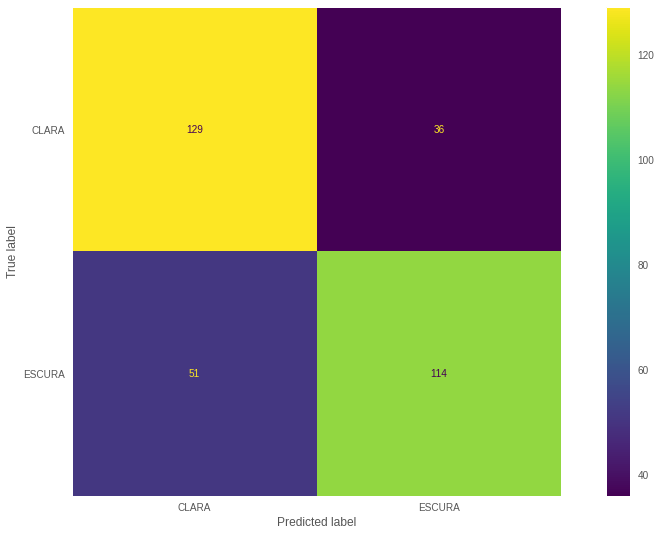

In [23]:
from sklearn.metrics import plot_confusion_matrix
mc_rf_cv=cm(y_test, y_rf_cv)
#mcd_Melhor=ConfusionMatrixDisplay(mc_rf_cv, display_labels=['CLARA','ESCURA'],)
#mcd_Melhor.plot()
plot_confusion_matrix(rf_cv, X_test, y_test, display_labels=['CLARA','ESCURA'])
plt.tick_params(axis=u'both', which=u'both',length=0)
plt.grid(b=None)
plt.show()


In [24]:
from sklearn.metrics import classification_report
y_pred=y_rf_cv
y_true=y_test
target_names = ['clara', 'turva/arraste']
print(classification_report(y_true, y_pred, target_names=target_names))

               precision    recall  f1-score   support

        clara       0.72      0.78      0.75       165
turva/arraste       0.76      0.69      0.72       165

     accuracy                           0.74       330
    macro avg       0.74      0.74      0.74       330
 weighted avg       0.74      0.74      0.74       330



### Árvore de Decisão

In [ ]:
parameters = {'criterion': ['gini', 'entropy'],
     'splitter': ['best', 'random'],
     'max_depth': [2*n for n in range(1,10)],
     'max_features': ['auto', 'sqrt'],
     'min_samples_leaf': [1, 2, 4],
     'min_samples_split': [2, 5, 10]}

tree = DecisionTreeClassifier()

In [ ]:
tree_cv=GridSearchCV(estimator=DecisionTreeClassifier(),param_grid=parameters,cv=10)
tree_cv.fit(X_train,y_train)

GridSearchCV(cv=10, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 4, 6, 8, 10, 12, 14, 16, 18],
                         'max_features': ['auto', 'sqrt'],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'splitter': ['best', 'random']})

In [ ]:
y_tree_cv=tree_cv.predict(X_test)

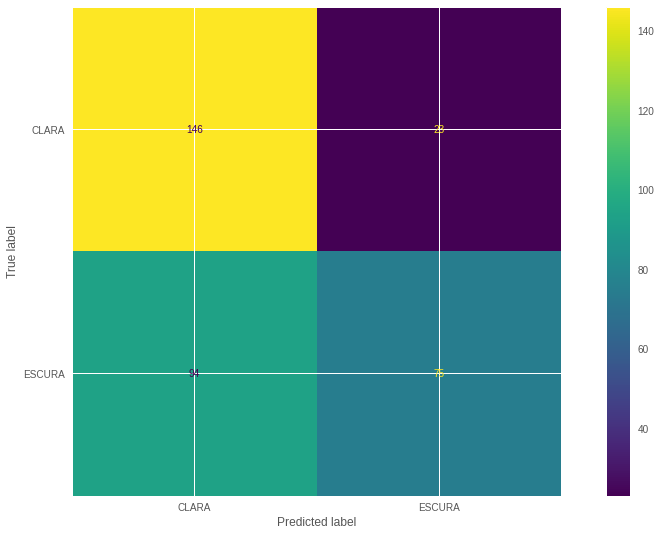

In [ ]:
mc_Tree=cm(y_test, y_tree_cv)
mcd_Tree=ConfusionMatrixDisplay(mc_Tree, display_labels=['CLARA','ESCURA'])
mcd_Tree.plot()

In [ ]:
print("Hiperparâmetros: ",tree_cv.best_params_)
print("Acurácia :",tree_cv.best_score_)

Hiperparâmetros:  {'criterion': 'gini', 'max_depth': 8, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 5, 'splitter': 'random'}
Acurácia : 0.6718215994531784


### Logística

In [ ]:
parameters ={'C':[0.01,0.1,1],
             'penalty':['l2'],
             'solver':['lbfgs']}

In [ ]:
parameters ={"C":[0.01,0.1,1],'penalty':['l2'], 'solver':['lbfgs']}# l1 lasso l2 ridge
lr=LogisticRegression()
logreg_cv=GridSearchCV(estimator=LogisticRegression(),param_grid=parameters,cv=10)
logreg_cv.fit(X_train,y_train)

GridSearchCV(cv=10, estimator=LogisticRegression(),
             param_grid={'C': [0.01, 0.1, 1], 'penalty': ['l2'],
                         'solver': ['lbfgs']})

In [ ]:
print("Hiperparâmetros: ",logreg_cv.best_params_)
print("Acurácia :",logreg_cv.best_score_)

Hiperparâmetros:  {'C': 0.01, 'penalty': 'l2', 'solver': 'lbfgs'}
Acurácia : 0.5937457279562542


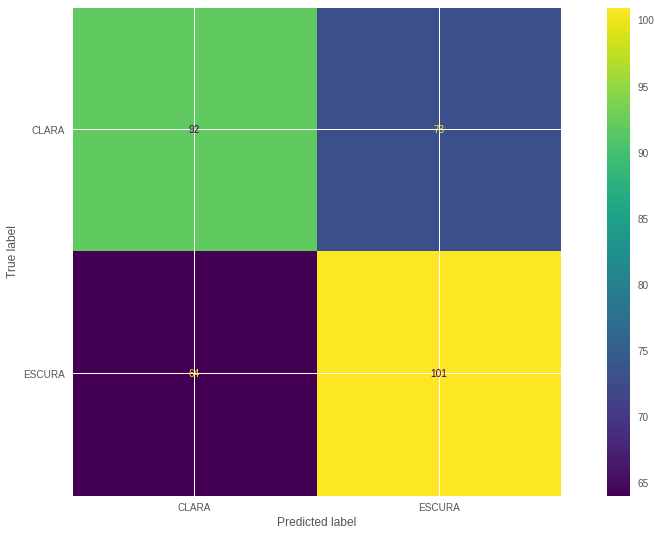

In [ ]:
y_predlog=logreg_cv.predict(X_test)
mc_log=cm(y_test, y_predlog)
mcdlog=ConfusionMatrixDisplay(mc_log, display_labels=['CLARA','ESCURA'])
mcdlog.plot()

## O melhor ajuste foi o Random Forest

### Preparando exportação do modelo

### Ajuste com todos os dados

### Ajuste com todos os dados disponíveis, sem o balanceamento, utilizando os melhores parâmetros levantados no GridSeacrh. Utilizado o class_weight='balanced' para informar ao ajuste do desbalanceamento. Este método atribui pesos a cada dado, baseado na distribuição.

In [53]:
rf_final=RandomForestClassifier(n_estimators=best_params_rf['n_estimators'],min_samples_leaf=best_params_rf['min_samples_leaf'],
                                max_features=best_params_rf['min_samples_leaf'], class_weight='balanced')
rf_final.fit(X,y)

RandomForestClassifier(class_weight='balanced', max_features=1)

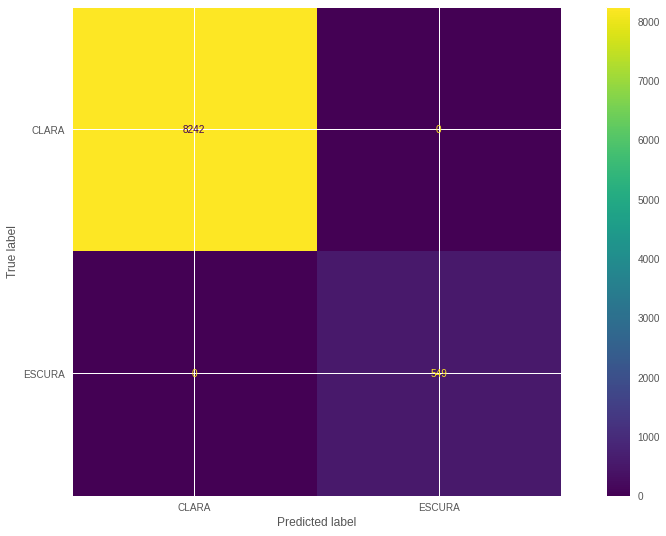

In [51]:
y_rf_final=rf_final.predict(X)
mc_final=cm(y, y_rf_final)
mcd_final=ConfusionMatrixDisplay(mc_final, display_labels=['CLARA','ESCURA'])
mcd_final.plot()

### Exportação do Modelo

In [52]:
# salvar modelo
import pickle
# salvar o modelo RandomForest (RF) no arquivo dessalgadora.pkl
with open('dessalgadora200A.pkl', 'wb') as file:
    pickle.dump(rf_final, file)

### Métrica

In [ ]:
from sklearn.metrics import classification_report
y_pred=y_rf_final
y_true=y_sub
target_names = ['clara', 'turva/arraste']
print(classification_report(y_true, y_pred, target_names=target_names))

               precision    recall  f1-score   support

        clara       1.00      1.00      1.00       549
turva/arraste       1.00      1.00      1.00       549

     accuracy                           1.00      1098
    macro avg       1.00      1.00      1.00      1098
 weighted avg       1.00      1.00      1.00      1098



## Gradient Booster

In [ ]:
clf = GradientBoostingClassifier(n_estimators=100,
                                 learning_rate=1.0, 
                                 max_depth=1, random_state=0)
clf.fit(X_train, y_train) 
clf.score(X_test, y_test) 


0.6727272727272727

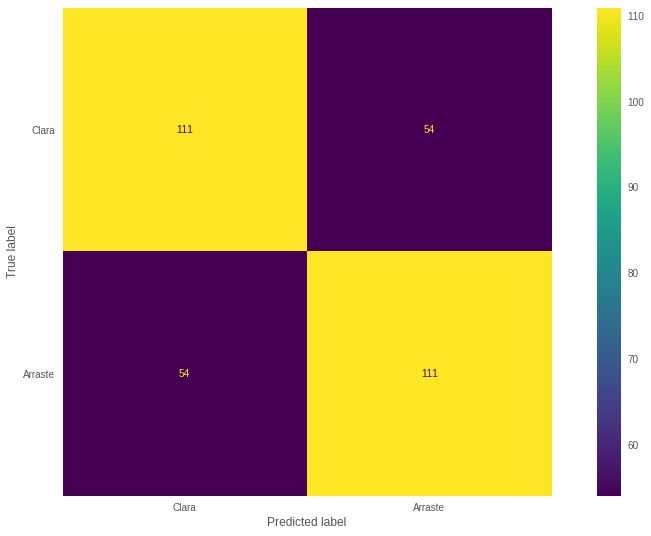

In [ ]:
plot_confusion_matrix(clf,X_test,y_test,display_labels=['Clara','Arraste'])
plt.grid(b=None)


[Text(0.5806459617899851, 0.9705882352941176, 'X[7] <= 68.104\ngini = 0.499\nsamples = 694\nvalue = [567, 531]'),
 Text(0.27255873972346784, 0.9117647058823529, 'X[0] <= 146.91\ngini = 0.487\nsamples = 432\nvalue = [392, 282]'),
 Text(0.10239162929745889, 0.8529411764705882, 'X[5] <= 45.032\ngini = 0.492\nsamples = 114\nvalue = [80, 103]'),
 Text(0.04783258594917788, 0.7941176470588235, 'X[0] <= 144.159\ngini = 0.489\nsamples = 55\nvalue = [51, 38]'),
 Text(0.017937219730941704, 0.7352941176470589, 'X[8] <= 71.604\ngini = 0.34\nsamples = 30\nvalue = [36, 10]'),
 Text(0.01195814648729447, 0.6764705882352942, 'gini = 0.0\nsamples = 14\nvalue = [23, 0]'),
 Text(0.02391629297458894, 0.6764705882352942, 'X[3] <= 0.897\ngini = 0.491\nsamples = 16\nvalue = [13, 10]'),
 Text(0.01195814648729447, 0.6176470588235294, 'X[5] <= 43.114\ngini = 0.375\nsamples = 10\nvalue = [12, 4]'),
 Text(0.005979073243647235, 0.5588235294117647, 'gini = 0.0\nsamples = 6\nvalue = [10, 0]'),
 Text(0.0179372197309417

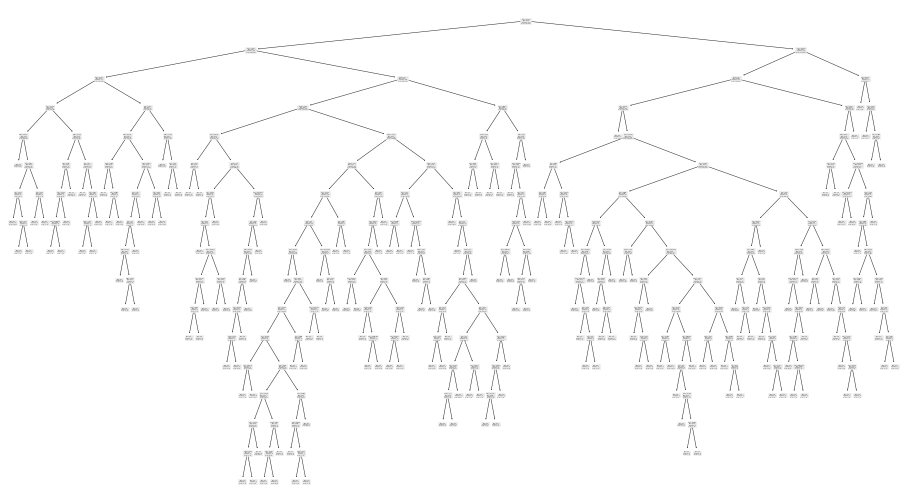

In [ ]:
from sklearn import tree
tree.plot_tree(rf_final.best_estimator_.estimators_[0])